## Hello World Graph

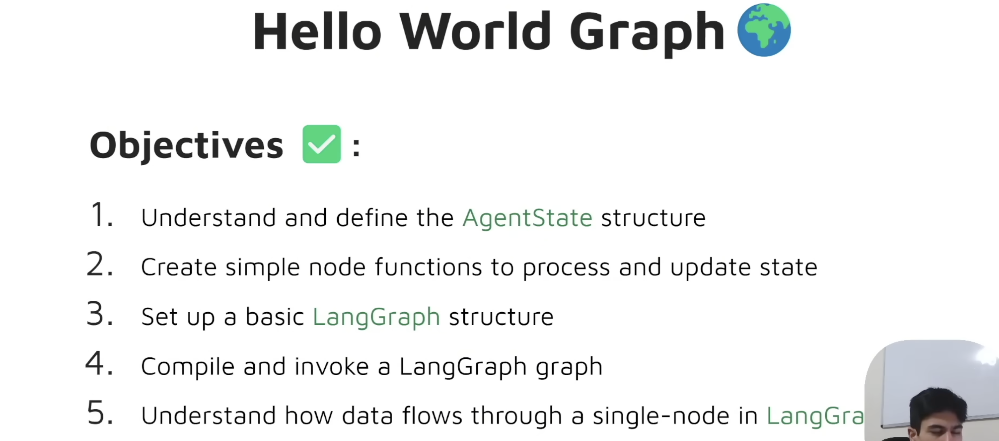

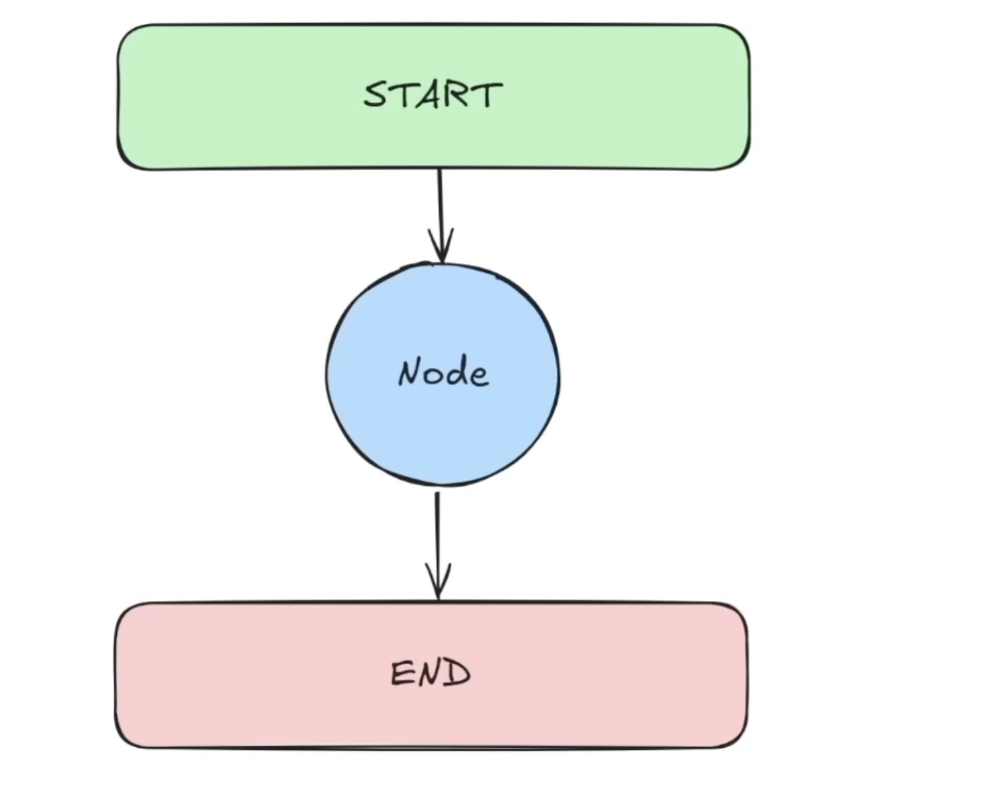

## Hello World Agent

Our first Langraph graph!

In [3]:
from typing import Dict,TypedDict
from langgraph.graph import StateGraph

In [ ]:
## we now create an AgentState- shared data structure that keeps track of info as your appln runs

class AgentState(TypedDict): ## our state schema
    message:str


## now we create node of the graph -it receives input as a state and passes output as updated state

def greeting_node(state:AgentState)->AgentState:
    '''
    Simple node that adds a greeting message to the state 
    '''

    state['message']='Hey'+state['message']+',how is your day going?'

    return state



In [6]:
graph=StateGraph(AgentState)

## to add a node to this graph
## add_node(name of your node, what action it will perform)

graph.add_node("greeter",greeting_node)

## to set the START NODE  
## It has one parameter --> key which is name of your node which you want to connect it with the START Node
graph.set_entry_point("greeter")
graph.set_finish_point("greeter")

app=graph.compile()

## Caution:

Just because the graph compiles without any error doesn't mean it will successfully run 

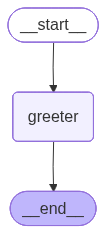

In [10]:
from IPython.display import Image,display

display(Image(app.get_graph().draw_mermaid_png()))

In [17]:
## to run it use inbuilt function invoke

result=app.invoke({'message':'Bob'})
result

{'message': 'HeyBob,how is your day going?'}

In [16]:
result['message']

'HeyBob,how is your day going?'

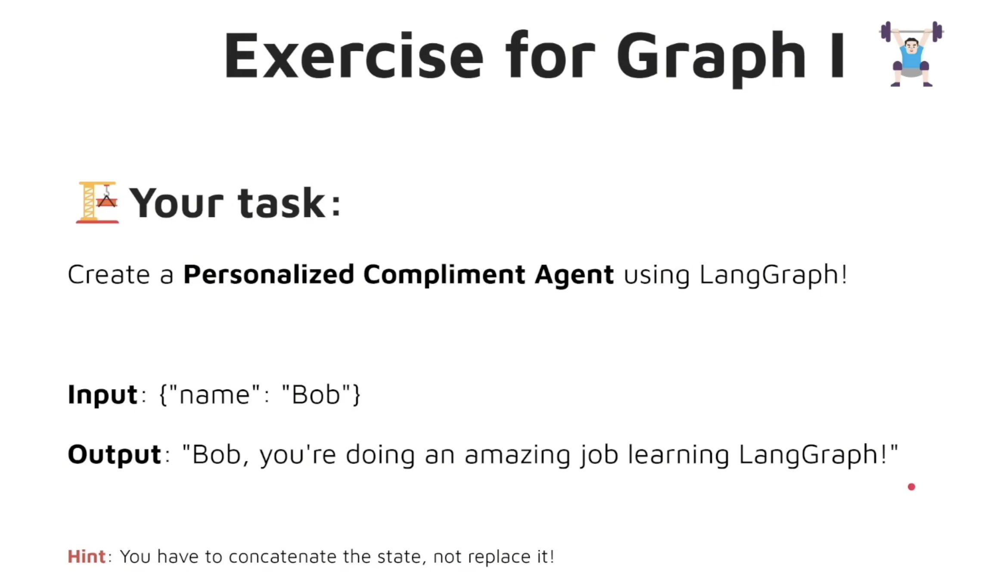

In [26]:
from langgraph.graph import StateGraph
from typing import Dict,TypedDict

In [27]:
## Step 1- Create AgentState

class AgentState(TypedDict):
    message:str

## Step 2-create a node

def compliment(state:AgentState)->AgentState:
    state['message']="{},you're doing an amazing job learning LangGraph!".format(state['message'])
    return state

In [28]:
## step 3-create a graph using StateGraph

graph=StateGraph(AgentState)
graph.add_node('complimenter',compliment)
graph.set_entry_point('complimenter')
graph.set_finish_point('complimenter')

## Step4-compile the graph
app=graph.compile()

In [29]:
result=app.invoke({'message':'Bob'})
result

{'message': "Bob,you're doing an amazing job learning LangGraph!"}

## Graph II

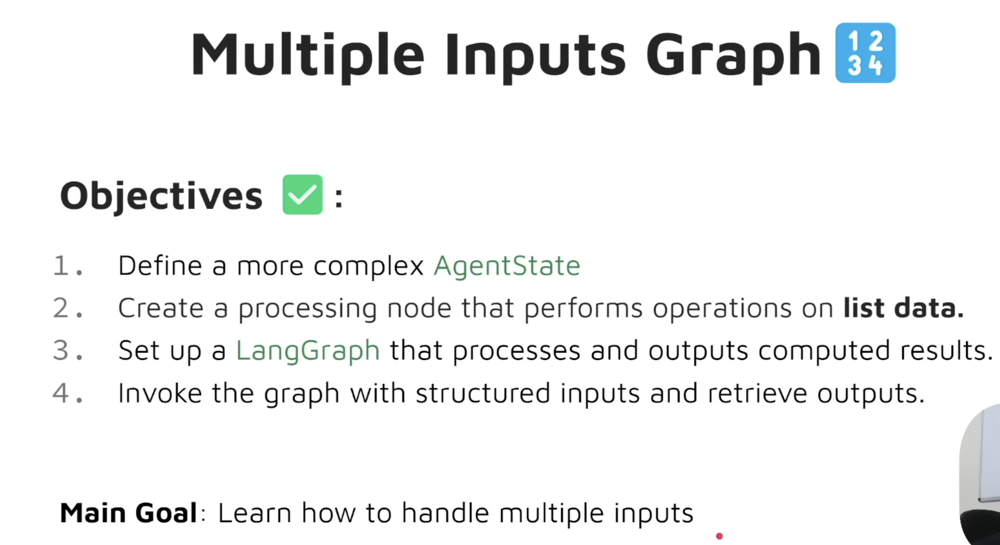

In [30]:
from typing import TypedDict,Dict
from langgraph.graph import StateGraph

In [36]:
class AgentState(TypedDict):
    values:list[int]
    name:str
    result:str


def process_values(state:AgentState)->AgentState:
    ''' 
    this fn handles multiple inputs
    '''
    print(state)
    state['result']=f'hi there {state['name']} Your sum={sum(state['values'])}'
    print(state)
    return state



In [37]:
graph=StateGraph(AgentState)

graph.add_node('processor',process_values)
graph.set_entry_point('processor')
graph.set_finish_point('processor')
app=graph.compile()

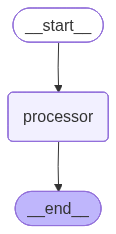

In [38]:
display(Image(app.get_graph().draw_mermaid_png()))

In [40]:
result=app.invoke({'values':[1,2,3,4],'name':'Steeve'})
## if you don't pass one argument as an input langraph makes it value None
result

{'values': [1, 2, 3, 4], 'name': 'Steeve'}
{'values': [1, 2, 3, 4], 'name': 'Steeve', 'result': 'hi there Steeve Your sum=10'}


{'values': [1, 2, 3, 4],
 'name': 'Steeve',
 'result': 'hi there Steeve Your sum=10'}

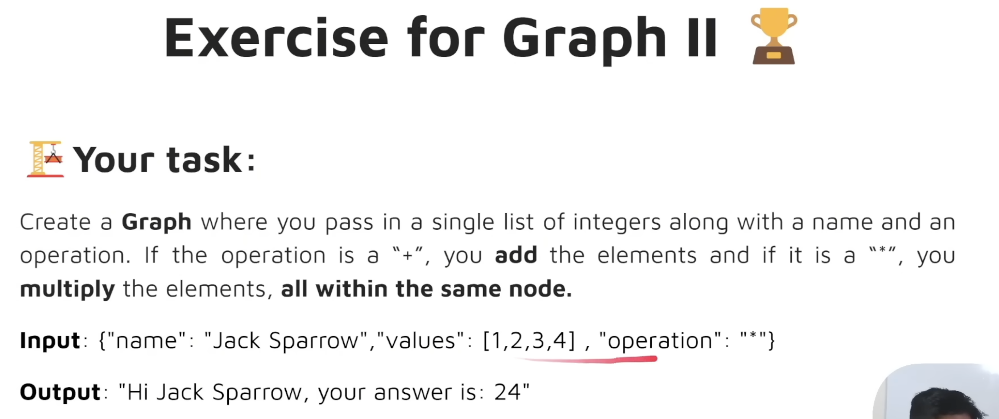

In [44]:
## step 1: create state
import math
class AgentNode(TypedDict):
    name:str
    values:list[int]
    operation:str
    result:str


## step 2: create the node

def operation_values(state:AgentNode)->AgentNode:
    if state['operation']=='+':
        state['result']=f"Hi {state['name']},your answer is: {sum(state['values'])}"
    
    else:
        state['result']=f"Hi {state['name']},your answer is: {math.prod(state['values'])}"
    return state



## step 3 : create graph
graph=StateGraph(AgentNode)

## step 4 : add nodes

graph.add_node('operator',operation_values)
graph.set_entry_point('operator')
graph.set_finish_point('operator')


## step 5: compile graph
app=graph.compile()

In [47]:
app.invoke({'name':'Jack Sparrow','values':[1,2,3,4],'operation':'*'})

{'name': 'Jack Sparrow',
 'values': [1, 2, 3, 4],
 'operation': '*',
 'result': 'Hi Jack Sparrow,your answer is: 24'}

In [48]:
app.invoke({'name':'Jack Sparrow','values':[1,2,3,4],'operation':'+'})

{'name': 'Jack Sparrow',
 'values': [1, 2, 3, 4],
 'operation': '+',
 'result': 'Hi Jack Sparrow,your answer is: 10'}

## Graph III

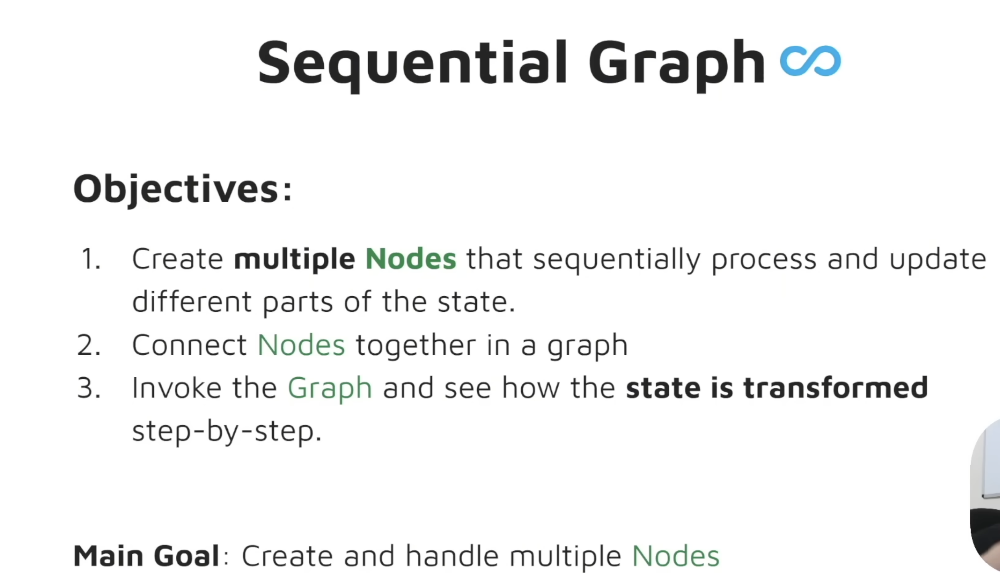

In [49]:
from typing import TypedDict,Dict
from langgraph.graph import StateGraph


In [50]:
class StateAgent(TypedDict):
    name:str
    age:int
    final:str




def first_node(state:AgentState)->AgentState:
    ''' 
    This is the first node of our sequence
    '''

    state['final']=f'Hi {state['name']}'
    return state

def second_node(state:AgentState)->AgentState:
    ''' 
    This is the first node of our sequence
    '''
    state['final']=state['final']+f"You are {state['age']} years old"

    return state





In [53]:
graph=StateGraph(StateAgent)


graph.add_node("first_node",first_node)
graph.add_node("second_node",second_node)

graph.set_entry_point("first_node")
graph.set_finish_point("second_node")

## How to connect first node and second node ??
## soln: element in graph we use is edge
## add_edge(first_node,second_node) ## directed edge

graph.add_edge('first_node','second_node')

app=graph.compile()

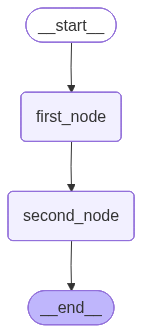

In [54]:
from IPython.display import display,Image

display(Image(app.get_graph().draw_mermaid_png()))

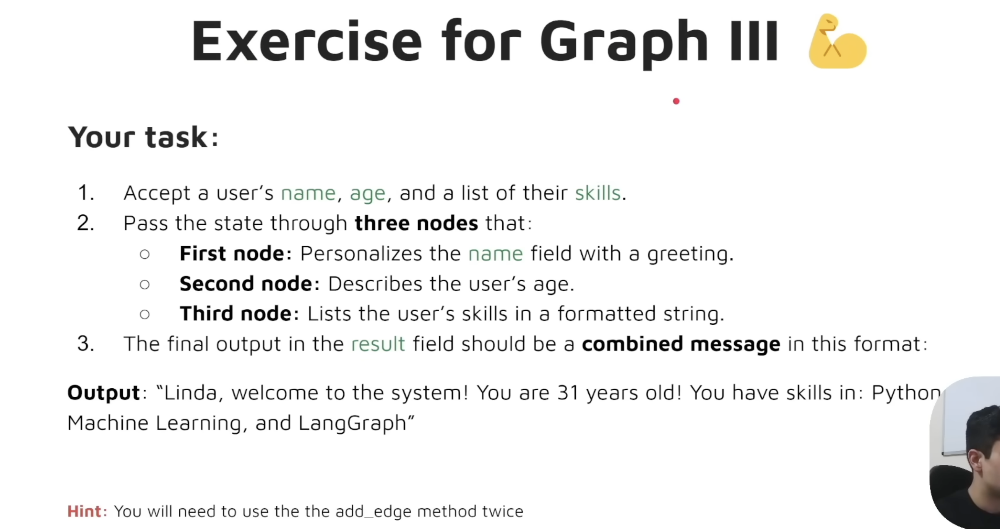

In [71]:
from langgraph.graph import StateGraph
from typing import Dict,TypedDict


## create state

class AgentState(TypedDict):
    name:str
    age:int
    skill:list[str]
    result:str



## create nodes

def greeting_node(state:AgentState)->AgentState:
    state['result']=f"{state['name']},Welcome to the system!"
    return state

def age_describing(state:AgentState)->AgentState:
    state['result']=state['result']+f"you are {state['age']} years old!"
    return state

def users_skills(state:AgentState)->AgentState:
    state['result']=state['result']+'You have skills in:'+" ".join(state['skill'][0:len(state['skill'])-1])+f" and {state['skill'][-1]}"
    return state


## create graph
graph=StateGraph(AgentState)

graph.add_node('first_node',greeting_node)
graph.add_node('second_node',age_describing)
graph.add_node('third_node',users_skills)

graph.set_entry_point('first_node')
graph.set_finish_point('third_node')

graph.add_edge('first_node','second_node')
graph.add_edge('second_node','third_node')


## compile

app=graph.compile()

In [72]:
app.invoke({'name':'Linda','age':31,'skill':['Python','ML','Langraph']})

{'name': 'Linda',
 'age': 31,
 'skill': ['Python', 'ML', 'Langraph'],
 'result': 'Linda,Welcome to the system!you are 31 years old!You have skills in:Python ML and Langraph'}

## Graph IV

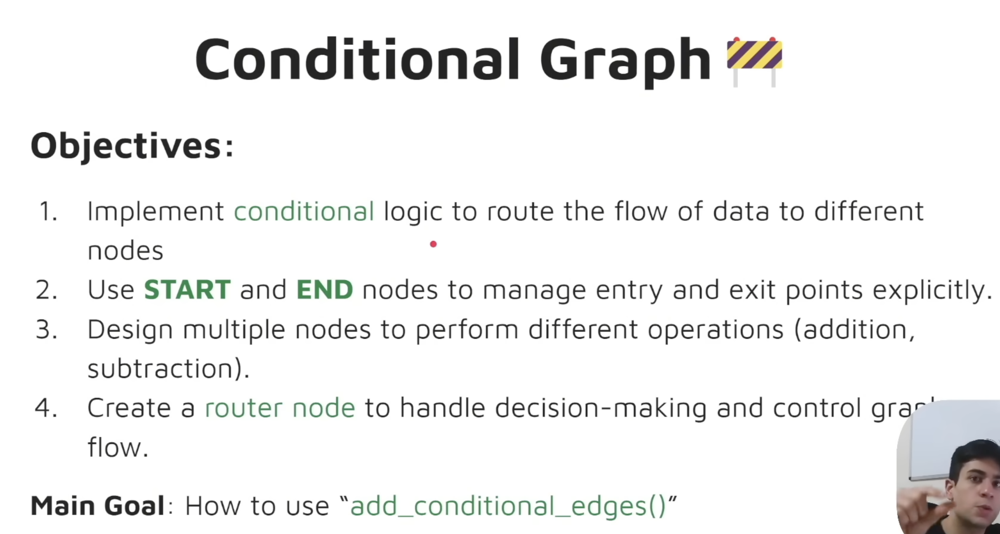

In [3]:
from typing import Dict,TypedDict
from langgraph.graph import StateGraph,START,END

Important: another way to intialize the start and end point 

In [19]:
class AgentState(TypedDict):
    number1:int
    operation:str
    number2:int
    finalNumber:int



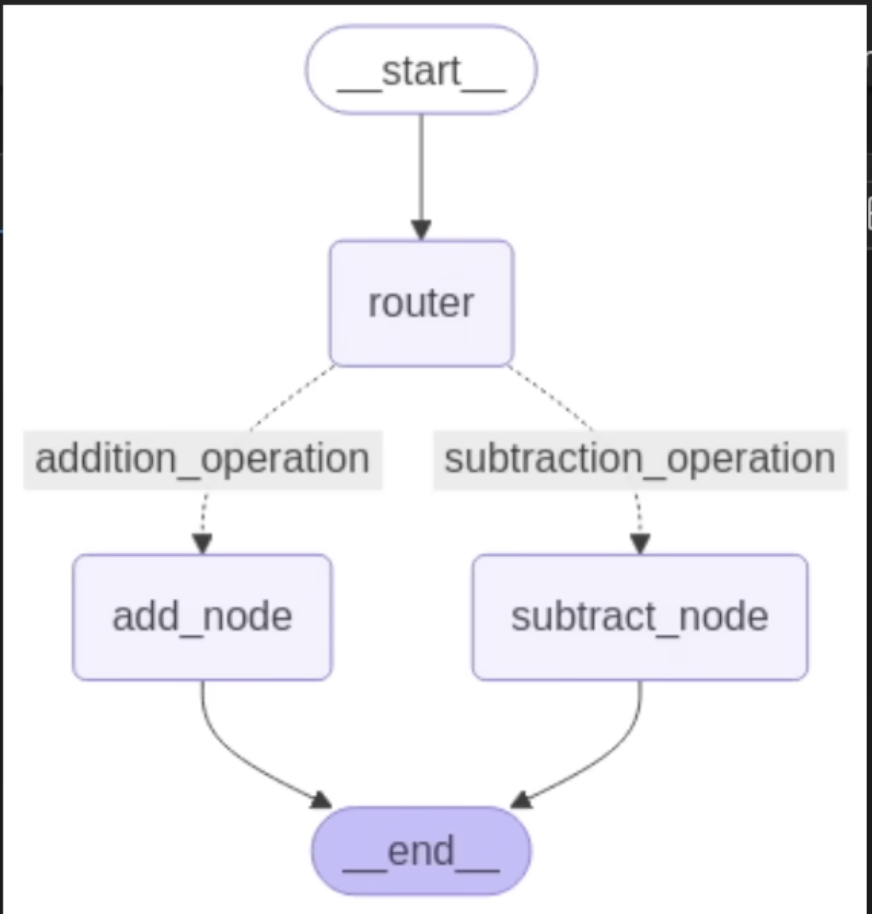

In [20]:
def adder(state:AgentState)->AgentState:
    """ This node adds 2 numbers"""
    state['final']=state['number1']+state['number2']
    return state

def subtracter(state:AgentState)->AgentState:
        """ This node subtracts 2 numbers"""
        state['finalNumber']=state['number1']-state['number2']
        return state

def decide_next_node(state:AgentState)->AgentState:
      ''' this node will select the next phase of graph '''
      if state['operation']=='+':
            return 'addition_operation'
      
      elif state['operation']=='-':
            return 'subtraction_operation'
      
## these are the edges which we are refrencing 
## in this third node we are not updating the state , we are just returning the edge


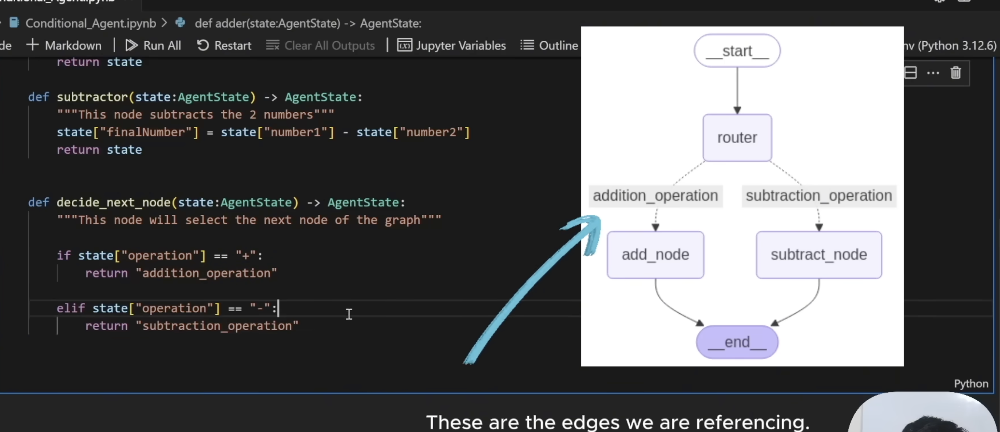

In [21]:
graph=StateGraph(AgentState)

graph.add_node('add_node',adder)
graph.add_node('subtract_node',subtracter)
## graph.add_node('router',decide_next_node) this doesn't work bcz it doesn't update state rather return edges
graph.add_node('router',lambda state:state) ## input and output state are same ## a passthrough fn

graph.add_edge(START,'router')


## for conditional edge it requires :
##  1-src node(source)
##  2-path fn which decides the movement (path)
##  3-path map is in the form of dictionary(path_map)
graph.add_conditional_edges(
    'router',
    decide_next_node,
    
    ## Edge:Node
    { 'addition_operation':'add_node',
     'subtraction_operation':'subtract_node'
    }
)

graph.add_edge('add_node',END)
graph.add_edge('subtract_node',END)
app=graph.compile()

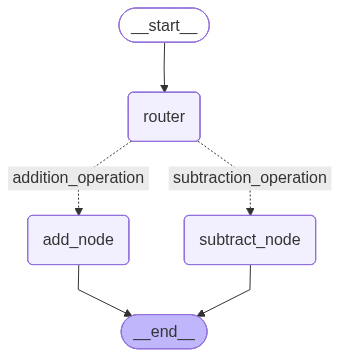

In [22]:
from IPython.display import display,Image

display(Image(app.get_graph().draw_mermaid_png()))

In [23]:
inital_state1=AgentState(number1=10,operation='-',number2=5)
print(app.invoke(inital_state1))

{'number1': 10, 'operation': '-', 'number2': 5, 'finalNumber': 5}


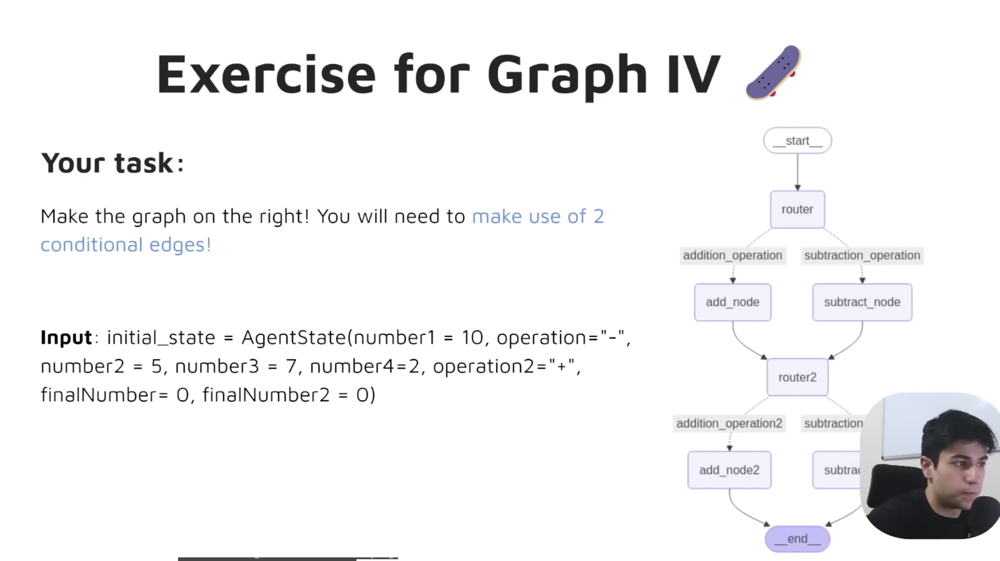

In [24]:
from langgraph.graph import START,END,StateGraph
from typing import TypedDict,Dict


In [26]:
## define the state

class AgentState(TypedDict):
    number1:int
    number2:int
    number3:int
    number4:int
    operation:str
    operation2:str
    finalNumber:int
    finalNumber2:int

In [27]:
## define the functions


def add_first_node(state:AgentState)->AgentState:
    state['finalNumber']=state['number1']+state['number2']
    return state

def sub_first_node(state:AgentState)->AgentState:
    state['finalNumber']=state['number1']-state['number2']
    return state

def decide_first_next_node(state:AgentState)->AgentState:
    if state['operation']=='+':
        return "addition_operation_e1"

    elif state['operation']=='-':
        return "subtraction_operation_e1"
    
def add_second_node(state:AgentState)->AgentState:
    state['finalNumber2']=state['number3']+state['number4']
    return state

def sub_second_node(state:AgentState)->AgentState:
    state['finalNumber2']=state['number3']-state['number4']
    return state

def decide_second_next_node(state:AgentState)->AgentState:
    if state['operation2']=='+':
        return "addition_operation_e2"

    elif state['operation2']=='-':
        return "subtraction_operation_e2"


In [40]:
## create the graph

graph=StateGraph(AgentState)

graph.add_node('adder_one',add_first_node)
graph.add_node('subtractor_one',sub_first_node)
graph.add_node('adder_second',add_second_node)
graph.add_node('subtractor_second',sub_second_node)
graph.add_node('router1',lambda state:state)
graph.add_node('router2',lambda state:state)

graph.add_edge(START,'router1')

graph.add_conditional_edges(
    'router1',
    decide_first_next_node,

    {
        'addition_operation_e1':'adder_one',
        'subtraction_operation_e1':'subtractor_one'
    }
)

graph.add_edge('adder_one','router2')
graph.add_edge('subtractor_one','router2')



graph.add_conditional_edges(
    'router2',
    decide_second_next_node,

    {
        'addition_operation_e2':'adder_second',
        'subtraction_operation_e2':'subtractor_second'
    }
)
graph.add_edge('adder_second',END)
graph.add_edge('subtractor_second',END)
app=graph.compile()

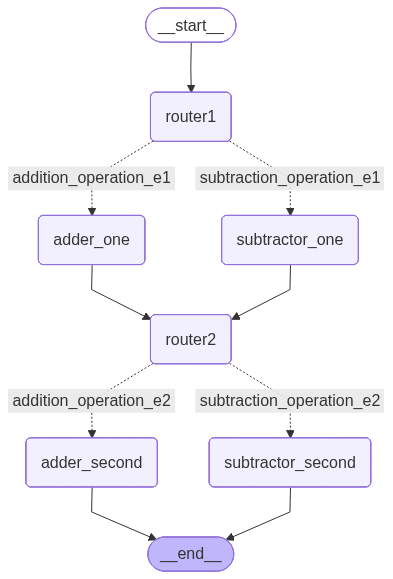

In [41]:
from IPython.display import display,Image

display(Image(app.get_graph().draw_mermaid_png()))

In [42]:
inital_state=AgentState(number1=10,operation='-',number2=5,number3=7,number4=2,operation2='+',finalNumber=0,finalNumber2=0)
type(inital_state)

dict

In [43]:
app.invoke(inital_state)

{'number1': 10,
 'number2': 5,
 'number3': 7,
 'number4': 2,
 'operation': '-',
 'operation2': '+',
 'finalNumber': 5,
 'finalNumber2': 9}

## Graph V

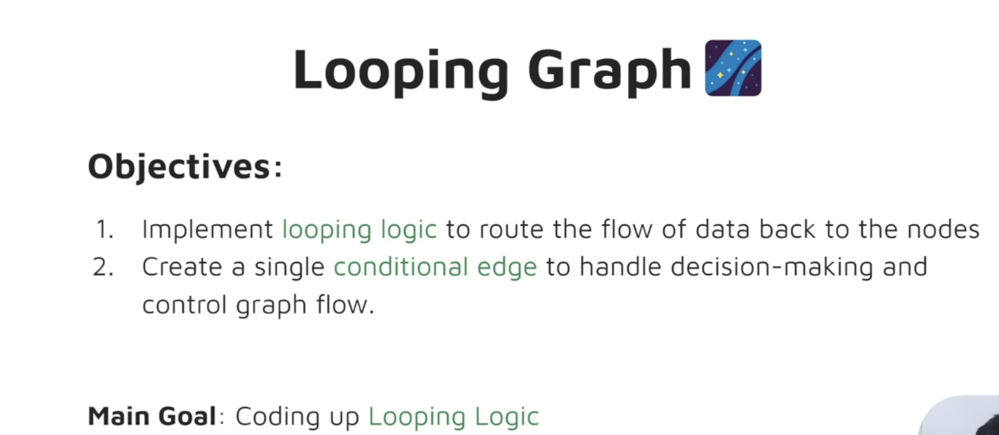

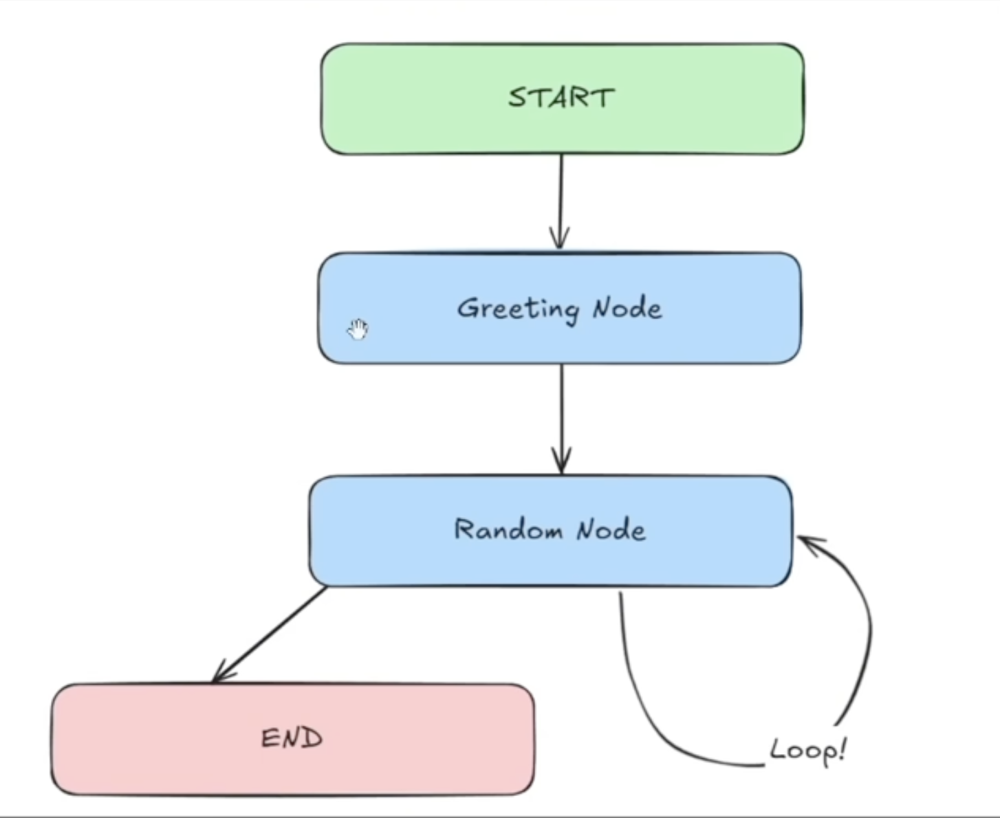

In [2]:
from langgraph.graph import START,END,StateGraph
from typing import Dict,TypedDict,List
import random

In [3]:
class AgentState(TypedDict):
    name:str
    number:List[int]
    counter:int

In [ ]:
def greeting_node(state:AgentState)->AgentState:
    """ Greeting node which says hi to the person"""
    state['name']=f"Hi there, {state['name']}"
    state['counter']=0

    return state


def random_node(state:AgentState)->AgentState:
    """ Generates a random no from 0 to 10"""
    state['number'].append(random.randint(0,10))
    state['counter']+=1
    return state

def should_continue(state:AgentState)->AgentState:
    """Function to decide what to do next"""
    if state['counter']<5:
        print("entering loop",state['counter'])
        return "loop" ## we continue the looping here ## Loop edge
    else:
        return "exit" ## we exit the loop here ## Exit Edge

In [ ]:
## Trajectory:greeting->random->random->random->random->random->END"

In [10]:
graph=StateGraph(AgentState)

graph.add_node("greeting",greeting_node)
graph.add_node("random",random_node)
graph.add_edge("greeting","random")


graph.add_conditional_edges(
    "random", ## source node
    should_continue, ## Routing function
    ## Edge:Node
    {
        "loop":"random", ## Self-loop back to same node
        "exit":END ## End the graph
    }
)

graph.set_entry_point("greeting")
app=graph.compile()


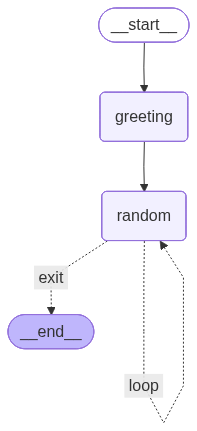

In [11]:
from IPython.display import Image,display
display(Image(app.get_graph().draw_mermaid_png()))

In [12]:
state=AgentState(name='Vaibhav',number=[],counter=-1)
app.invoke(state)

entering loop 1
entering loop 2
entering loop 3
entering loop 4


{'name': 'Hi there, Vaibhav', 'number': [9, 1, 8, 2, 6], 'counter': 5}

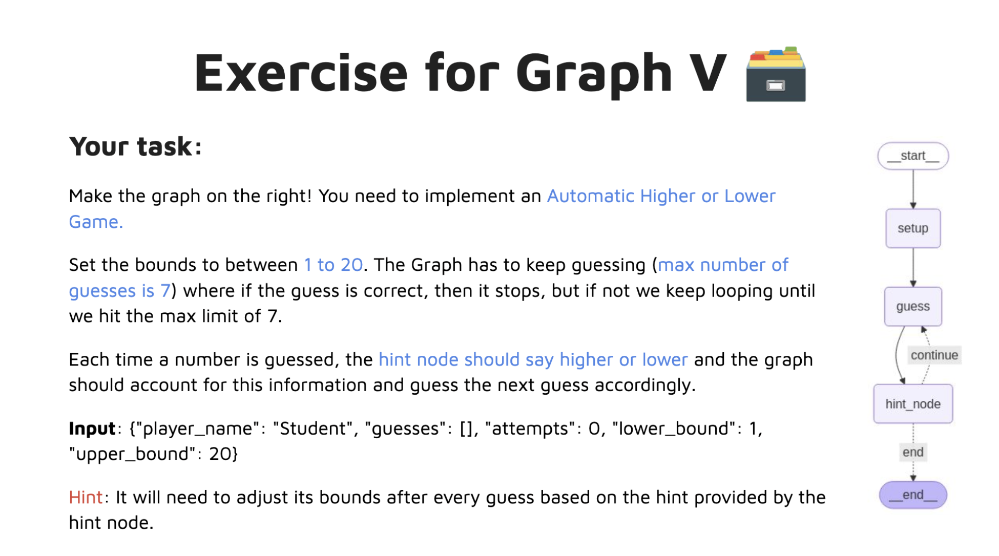

In [32]:
from typing import Dict,TypedDict,List
from langgraph.graph import START,END,StateGraph
from IPython.display import display,Image
import random
num=int(input("Enter the number between 1 to 20"))

In [41]:
class AgentState(TypedDict):
    player_name:str
    guesses:List[int]
    attempts:int ## max is 7
    lower_bound:int
    upper_bound:int


def setup_node(state:AgentState)->AgentState:
    ''' sets all the measures of state'''
    state['player_name']=f"Hi there, {state['player_name']}"
    state['lower_bound']=1
    state['upper_bound']=20
    state['attempts']=0
    return state

def guess_node(state:AgentState)->AgentState:
    ''' gives a random_guess '''
    state['attempts']+=1
    lb=state['lower_bound']
    ub=state['upper_bound']
    x=random.randint(lb,ub)
    state['guesses'].append(x)
    return state

def hint_node(state:AgentState)->AgentState:
    ''' checks whether the guess is larger or smaller than the answer'''
    guess=state['guesses'][-1]
    if(guess < num):
        print("guess a bigger number")
        state['lower_bound']=guess+1
    elif(guess > num):
        print("guess a smaller number")
        state['upper_bound']=guess-1
    return state

def should_continue(state:AgentState)->AgentState:
    """Function to decide what to do next"""
    if state['guesses'][-1]==num:
        print(f"You won the game in {state['attempts']}")
        return "exit"
    
    elif ((state['guesses'][-1]!=num) and (state['attempts']!=7)):
        return "loop"
    
    else:
        print('You lost the game')
        return "exit"


    

In [42]:
graph=StateGraph(AgentState)


graph.add_node('guess_node',guess_node)
graph.add_node('setup_node',setup_node)
graph.add_node('hint_node',hint_node)
graph.set_entry_point('setup_node')
graph.add_edge('setup_node','guess_node')
graph.add_edge('guess_node','hint_node')
graph.add_conditional_edges(
    'hint_node',
    should_continue,
    {
        'exit':END,
        'loop':'guess_node'
    }
)

app=graph.compile()

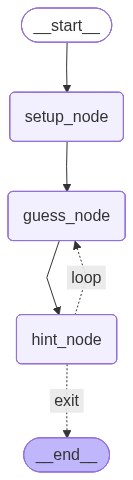

In [43]:
display(Image(app.get_graph().draw_mermaid_png()))

In [51]:
inital_state=AgentState(player_name='priyanshu',guesses=[],attempts=100,lower_bound=120,upper_bound=200)

app.invoke(inital_state)

guess a smaller number
guess a bigger number
guess a bigger number
guess a smaller number
guess a smaller number
guess a bigger number
guess a bigger number
You lost the game


{'player_name': 'Hi there, priyanshu',
 'guesses': [16, 5, 8, 14, 13, 10, 11],
 'attempts': 7,
 'lower_bound': 12,
 'upper_bound': 12}